In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
files_2014 = ['/Users/cheyen/Desktop/projet_certification/ML_BLOC3/uber/dataset/uber-trip-data/uber-raw-data-apr14.csv',
            '/Users/cheyen/Desktop/projet_certification/ML_BLOC3/uber/dataset/uber-trip-data/uber-raw-data-may14.csv',
            '/Users/cheyen/Desktop/projet_certification/ML_BLOC3/uber/dataset/uber-trip-data/uber-raw-data-jun14.csv',
            '/Users/cheyen/Desktop/projet_certification/ML_BLOC3/uber/dataset/uber-trip-data/uber-raw-data-jul14.csv',
            '/Users/cheyen/Desktop/projet_certification/ML_BLOC3/uber/dataset/uber-trip-data/uber-raw-data-aug14.csv',
            '/Users/cheyen/Desktop/projet_certification/ML_BLOC3/uber/dataset/uber-trip-data/uber-raw-data-sep14.csv']

df14 = pd.DataFrame()
for file in files_2014:
    df = pd.read_csv(file,encoding='utf-8')
    df14 = pd.concat([df,df14])

In [3]:
df14.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


### 1. Data Exploration

In [3]:
df = df14.copy()

In [5]:
df.shape

(4534327, 4)

In [6]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [7]:
df.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

### 2. Data modification

In [4]:
# Conversion des dates en colonne "datetime"
df['Date/Time'] = pd.to_datetime(df['Date/Time'], format='%m/%d/%Y %H:%M:%S')

In [5]:
df['month'] = df['Date/Time'].dt.month_name()
df['weekday'] = df['Date/Time'].dt.day_name()
df['day'] = df['Date/Time'].dt.day
df['hour'] = df['Date/Time'].dt.hour
df['minute'] = df['Date/Time'].dt.minute

df = df.drop(df.columns[0], axis=1)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4534327 entries, 0 to 564515
Data columns (total 8 columns):
 #   Column   Dtype  
---  ------   -----  
 0   Lat      float64
 1   Lon      float64
 2   Base     object 
 3   month    object 
 4   weekday  object 
 5   day      int32  
 6   hour     int32  
 7   minute   int32  
dtypes: float64(2), int32(3), object(3)
memory usage: 259.5+ MB


In [6]:
# Réinitialiser les index pour qu'ils soient continus à partir de zéro
df.reset_index(drop=True, inplace=True)

In [12]:
df

,Lat,Lon,Base,month,weekday,day,hour,minute
0,40.2201,-74.0021,B02512,September,Monday,1,0,1
1,40.7500,-74.0027,B02512,September,Monday,1,0,1
2,40.7559,-73.9864,B02512,September,Monday,1,0,3
3,40.7450,-73.9889,B02512,September,Monday,1,0,6
4,40.8145,-73.9444,B02512,September,Monday,1,0,11
...,...,...,...,...,...,...,...,...
4534322,40.7640,-73.9744,B02764,April,Wednesday,30,23,22
4534323,40.7629,-73.9672,B02764,April,Wednesday,30,23,26
4534324,40.7443,-73.9889,B02764,April,Wednesday,30,23,31
4534325,40.6756,-73.9405,B02764,April,Wednesday,30,23,32


### 3. Data Visualization

<Axes: xlabel='weekday', ylabel='count'>

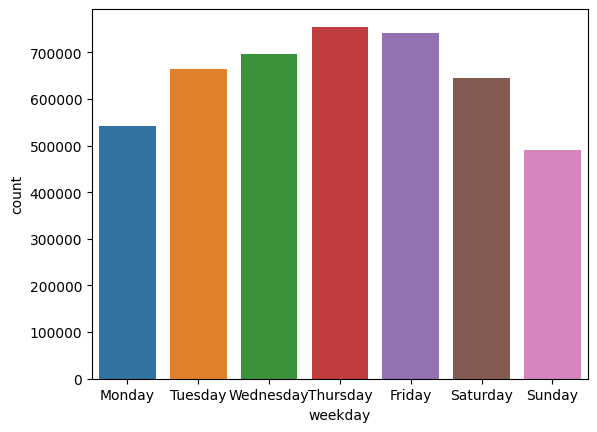

In [13]:
# Visualisation du nombre de courses / jours de la semaine
sns.countplot(df, x='weekday')

<Axes: xlabel='month', ylabel='count'>

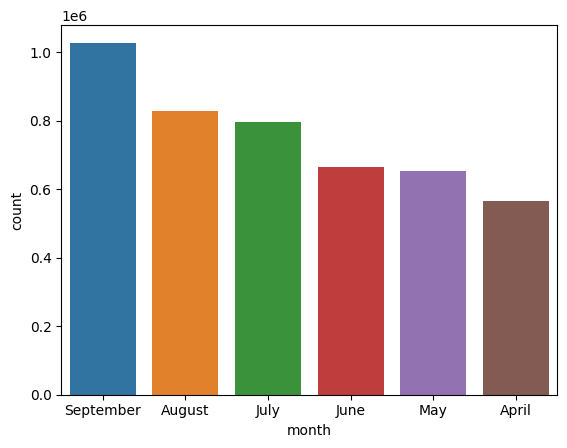

In [14]:
# Visualisation du nombre de courses / mois 
sns.countplot(df, x='month')

<Axes: xlabel='hour', ylabel='count'>

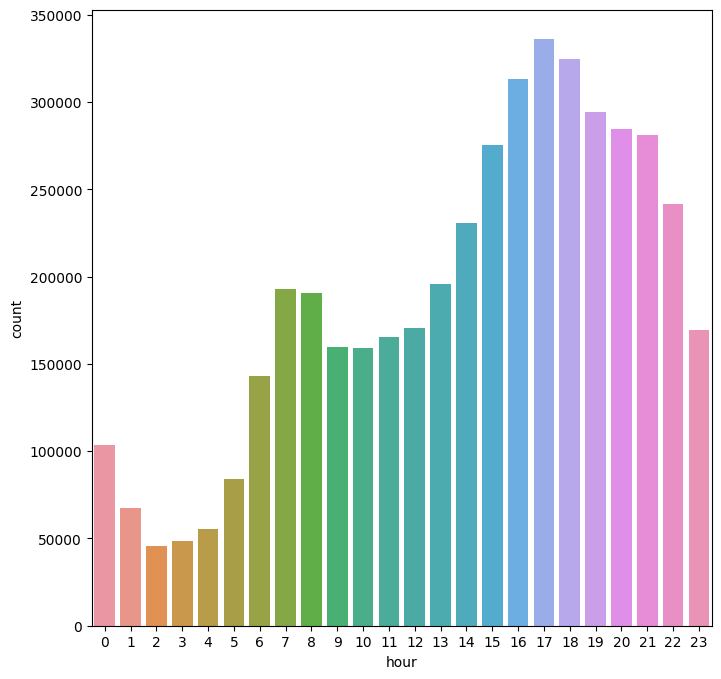

In [15]:
# Visualisation du nombre de courses/heures
plt.figure(figsize=(8,8))
sns.countplot(df, x='hour')

<Axes: xlabel='day', ylabel='count'>

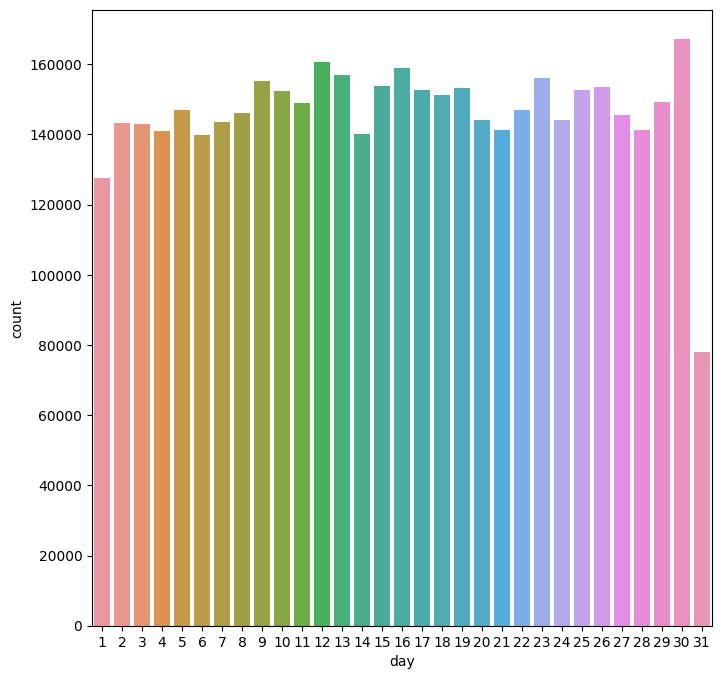

In [16]:
# Visualisation du nombre de courses / jours du mois
plt.figure(figsize=(8,8))
sns.countplot(df, x='day')

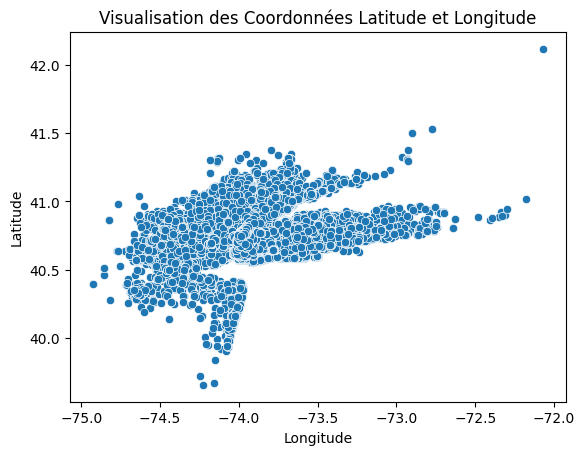

In [17]:
sns.scatterplot(x='Lon', y='Lat', data=df)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Visualisation des Coordonnées Latitude et Longitude')
plt.show()

### 4. Preprocessing

In [6]:
# Filtrage des données pour faciliter les calculs
df_sampled = df.sample(200000)

In [7]:
df_sampled

,Lat,Lon,Base,month,weekday,day,hour,minute
31155,40.7187,-74.0091,B02512,April,Monday,28,9,51
790301,40.7551,-73.9944,B02764,July,Saturday,12,10,33
359717,40.7399,-74.0061,B02682,April,Friday,4,21,37
467032,40.7276,-73.9906,B02617,July,Monday,21,19,37
849537,40.6485,-73.7827,B02682,September,Tuesday,30,21,58
...,...,...,...,...,...,...,...,...
222338,40.7486,-73.9929,B02617,April,Wednesday,2,6,47
79580,40.7639,-73.9116,B02598,July,Tuesday,8,14,28
243845,40.6751,-74.0166,B02598,May,Saturday,24,20,16
446640,40.8042,-73.9375,B02617,September,Saturday,13,21,46


In [8]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

X = df_sampled[['Lat','Lon']]
sc = StandardScaler()

X = sc.fit_transform(X)

In [9]:
from sklearn.cluster import KMeans

wcss =  []
k = []
for i in range (1,11): 
    kmeans = KMeans(n_clusters= i, random_state = 0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print("WCSS for K={} --> {}".format(i, wcss[-1]))

/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=1 --> 400000.00000000047


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=2 --> 285261.4457009645


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=3 --> 198630.25384845005


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=4 --> 162260.83814137575


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=5 --> 136839.82940897308


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=6 --> 110506.42599520808


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=7 --> 93084.40622424311


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=8 --> 80337.54411987658


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=9 --> 70537.75517507395


/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


WCSS for K=10 --> 63235.58099145479


In [10]:
import plotly.express as px

# Create DataFrame
wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)

fig.show()

In [12]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=0)

# Fit kmeans to our dataset
kmeans.fit(X)

/Users/cheyen/Desktop/projet_certification/projectenv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=3, random_state=0)

In [13]:
# Assigner chaque exemple à un cluster
cluster_labels = kmeans.predict(X)

# Obtenir les centroids des clusters
centroids = kmeans.cluster_centers_

In [14]:
df_sampled['Cluster'] = kmeans.predict(X)
df_sampled

,Lat,Lon,Base,month,weekday,day,hour,minute,Cluster
31155,40.7187,-74.0091,B02512,April,Monday,28,9,51,1
790301,40.7551,-73.9944,B02764,July,Saturday,12,10,33,0
359717,40.7399,-74.0061,B02682,April,Friday,4,21,37,1
467032,40.7276,-73.9906,B02617,July,Monday,21,19,37,1
849537,40.6485,-73.7827,B02682,September,Tuesday,30,21,58,2
...,...,...,...,...,...,...,...,...,...
222338,40.7486,-73.9929,B02617,April,Wednesday,2,6,47,0
79580,40.7639,-73.9116,B02598,July,Tuesday,8,14,28,0
243845,40.6751,-74.0166,B02598,May,Saturday,24,20,16,1
446640,40.8042,-73.9375,B02617,September,Saturday,13,21,46,0


In [15]:
import plotly.express as px
# Créez une DataFrame avec les données de latitude, longitude et les étiquettes de cluster
data_for_map = df_sampled[['Lat', 'Lon', 'Cluster']]

# Créez une carte scatterplot avec Plotly
fig = px.scatter_mapbox(
    data_for_map,
    lat='Lat',
    lon='Lon',
    color='Cluster',
    size_max=15,
    zoom=10  # Réglez le niveau de zoom initial
)

# Personnalisez la mise en page de la carte
fig.update_layout(
    mapbox_style="carto-positron",
    title="Clusters de données sur la carte",
    margin={"r":0,"t":30,"l":0,"b":0},
)

# Affichez la carte
fig.show()